# Generative Adversarial Networks

For this part of the assignment you implement two different types of generative adversarial networks. We will train the networks on the Celeb A dataset which is a large set of celebrity face images.

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)



Mounted at /content/drive


In [2]:
import os

os.chdir("/content/drive/MyDrive/GAN_747")


In [3]:
# !/usr/bin/env bash ./download_celeba.sh

In [4]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

In [5]:
from gan.train import train

In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "gpu")

# GAN loss functions

In this assignment you will implement two different types of GAN cost functions. You will first implement the loss from the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf). You will also implement the loss from [LS-GAN](https://arxiv.org/abs/1611.04076). 

### GAN loss

**TODO:** Implement the `discriminator_loss` and `generator_loss` functions in `gan/losses.py`.

The generator loss is given by:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: You should use the `torch.nn.functional.binary_cross_entropy_with_logits` function to compute the binary cross entropy loss since it is more numerically stable than using a softmax followed by BCE loss. The BCE loss is needed to compute the log probability of the true label given the logits output from the discriminator. Given a score $s\in\mathbb{R}$ and a label $y\in\{0, 1\}$, the binary cross entropy loss is

$$ bce(s, y) = -y * \log(s) - (1 - y) * \log(1 - s) $$


Instead of computing the expectation of $\log D(G(z))$, $\log D(x)$ and $\log \left(1-D(G(z))\right)$, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing.

In [7]:
from gan.losses import discriminator_loss, generator_loss

### Least Squares GAN loss

**TODO:** Implement the `ls_discriminator_loss` and `ls_generator_loss` functions in `gan/losses.py`.

We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alernative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`scores_real` and `scores_fake`).

In [8]:
from gan.losses import ls_discriminator_loss, ls_generator_loss

# GAN model architecture

**TODO:** Implement the `Discriminator` and `Generator` networks in `gan/models.py`.

We recommend the following architectures which are inspired by [DCGAN](https://arxiv.org/pdf/1511.06434.pdf):

**Discriminator:**

- convolutional layer with in_channels=3, out_channels=128, kernel=4, stride=2
- convolutional layer with in_channels=128, out_channels=256, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=256, out_channels=512, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=512, out_channels=1024, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=1024, out_channels=1, kernel=4, stride=1

Use padding = 1 (not 0) for all the convolutional layers.

Instead of Relu we LeakyReLu throughout the discriminator (we use a negative slope value of 0.2). You can use simply use relu as well.

The output of your discriminator should be a single value score corresponding to each input sample. See `torch.nn.LeakyReLU`.


**Generator:**

**Note:** In the generator, you will need to use transposed convolution (sometimes known as fractionally-strided convolution or deconvolution). This function is implemented in pytorch as `torch.nn.ConvTranspose2d`.

- transpose convolution with in_channels=NOISE_DIM, out_channels=1024, kernel=4, stride=1
- batch norm
- transpose convolution with in_channels=1024, out_channels=512, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=512, out_channels=256, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=256, out_channels=128, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=128, out_channels=3, kernel=4, stride=2

The output of the final layer of the generator network should have a `tanh` nonlinearity to output values between -1 and 1. The output should be a 3x64x64 tensor for each sample (equal dimensions to the images from the dataset).





In [9]:
from gan.models import Discriminator, Generator

# Data loading: Celeb A Dataset

The CelebA images we provide have been filtered to obtain only images with clear faces and have been cropped and downsampled to 128x128 resolution.

In [10]:
batch_size = 128
scale_size = 64  # We resize the images to 64x64 for training

celeba_root = 'celeba_data'

In [12]:
celeba_train = ImageFolder(root=celeba_root, transform=transforms.Compose([
  transforms.Resize(scale_size),
  transforms.ToTensor(),
]))

celeba_loader_train = DataLoader(celeba_train, batch_size=batch_size, drop_last=True, num_workers = 12)

### Visualize dataset

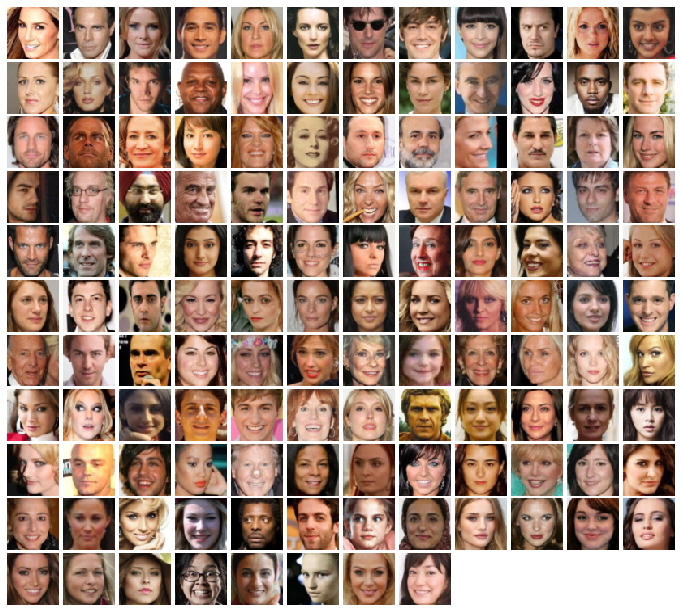

In [13]:
from gan.utils import show_images

imgs_iter = celeba_loader_train.__iter__()
imgs = next(imgs_iter)[0].numpy().squeeze()
show_images(imgs, color=True)

# Training 


**TODO:** Fill in the training loop in `gan/train.py`.

In [14]:
NOISE_DIM = 100
NUM_EPOCHS = 50
learning_rate = 0.0002

### Train GAN

In [15]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [16]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 0.4974, G:2.019


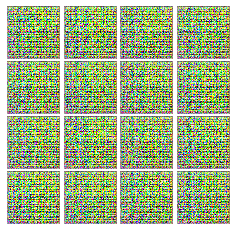


EPOCH:  2
Iter: 150, D: 1.295, G:2.062


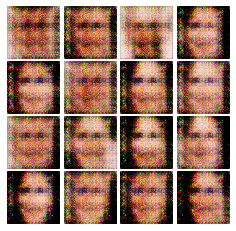


EPOCH:  3
Iter: 300, D: 0.19, G:1.979


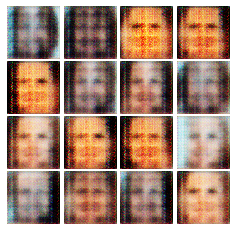


EPOCH:  4
Iter: 450, D: 0.3632, G:2.072


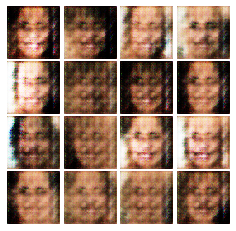


EPOCH:  5
EPOCH:  6
Iter: 600, D: 0.1803, G:1.907


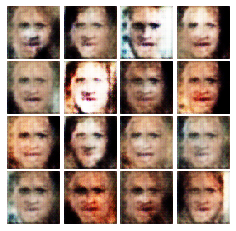


EPOCH:  7
Iter: 750, D: 0.5527, G:5.12


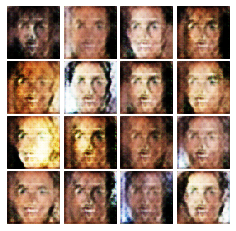


EPOCH:  8
Iter: 900, D: 0.2452, G:0.4166


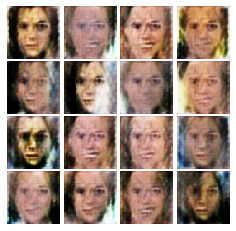


EPOCH:  9
EPOCH:  10
Iter: 1050, D: 0.1429, G:2.78


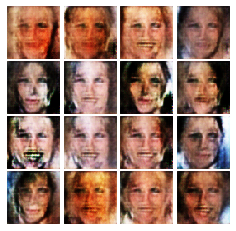


EPOCH:  11
Iter: 1200, D: 0.1651, G:2.326


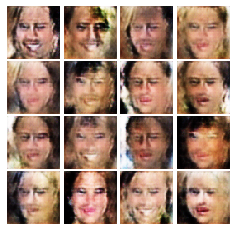


EPOCH:  12
Iter: 1350, D: 0.1412, G:1.603


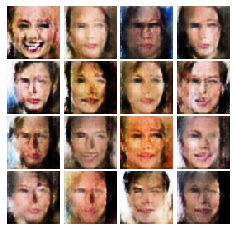


EPOCH:  13
Iter: 1500, D: 0.286, G:1.454


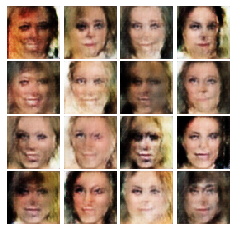


EPOCH:  14
EPOCH:  15
Iter: 1650, D: 0.2115, G:1.857


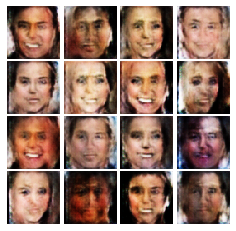


EPOCH:  16
Iter: 1800, D: 0.2904, G:1.331


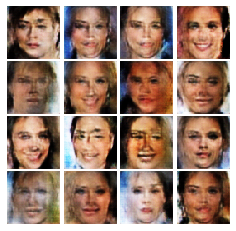


EPOCH:  17
Iter: 1950, D: 0.2026, G:2.734


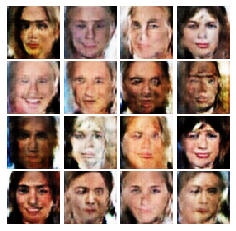


EPOCH:  18
EPOCH:  19
Iter: 2100, D: 0.07846, G:2.48


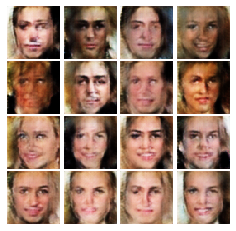


EPOCH:  20
Iter: 2250, D: 0.1618, G:1.452


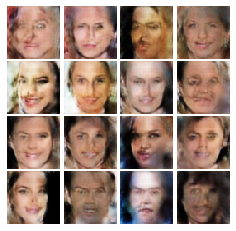


EPOCH:  21
Iter: 2400, D: 0.05883, G:2.217


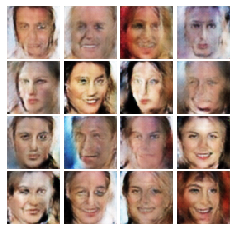


EPOCH:  22
Iter: 2550, D: 0.02211, G:3.967


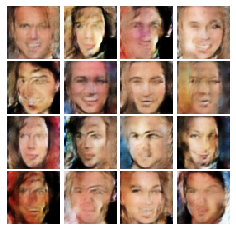


EPOCH:  23
EPOCH:  24
Iter: 2700, D: 0.2879, G:2.34


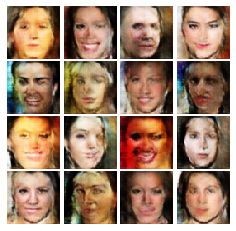


EPOCH:  25
Iter: 2850, D: 1.389, G:3.067


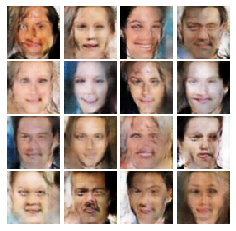


EPOCH:  26
Iter: 3000, D: 0.1032, G:1.79


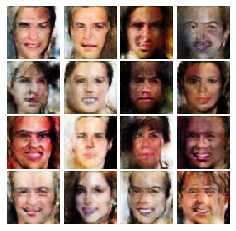


EPOCH:  27
EPOCH:  28
Iter: 3150, D: 0.03942, G:2.463


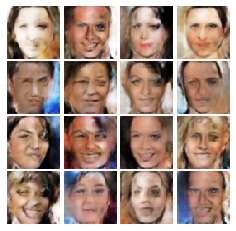


EPOCH:  29
Iter: 3300, D: 0.2001, G:1.121


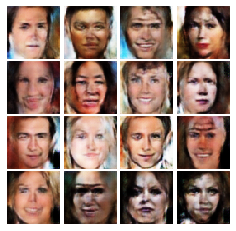


EPOCH:  30
Iter: 3450, D: 0.1281, G:2.383


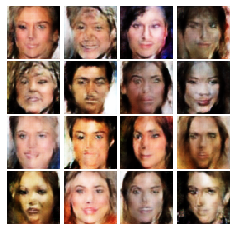


EPOCH:  31
EPOCH:  32
Iter: 3600, D: 0.0683, G:2.114


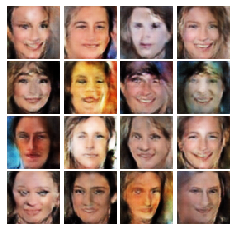


EPOCH:  33
Iter: 3750, D: 0.09383, G:1.915


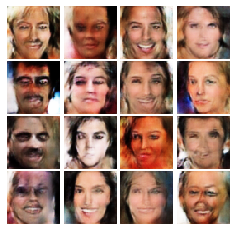


EPOCH:  34
Iter: 3900, D: 0.1363, G:1.696


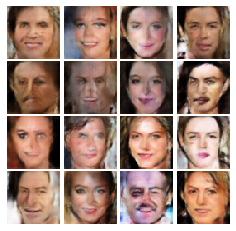


EPOCH:  35
Iter: 4050, D: 0.02422, G:2.852


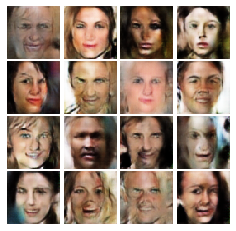


EPOCH:  36
EPOCH:  37
Iter: 4200, D: 0.2655, G:2.13


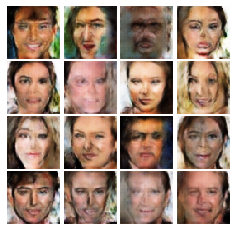


EPOCH:  38
Iter: 4350, D: 0.1655, G:2.799


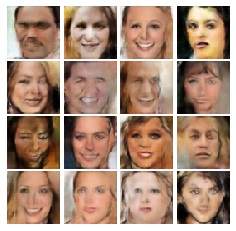


EPOCH:  39
Iter: 4500, D: 0.1475, G:1.746


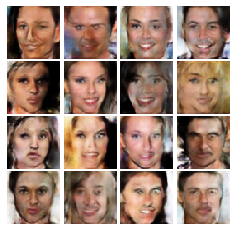


EPOCH:  40
EPOCH:  41
Iter: 4650, D: 0.07019, G:1.825


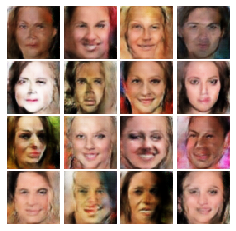


EPOCH:  42
Iter: 4800, D: 0.1178, G:2.863


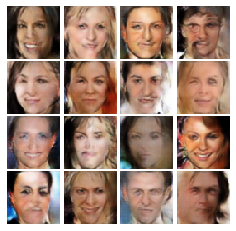


EPOCH:  43
Iter: 4950, D: 0.08092, G:3.783


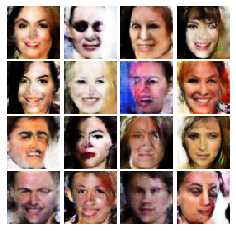


EPOCH:  44
Iter: 5100, D: 0.1798, G:1.857


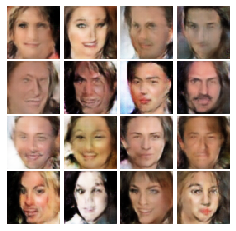


EPOCH:  45
EPOCH:  46
Iter: 5250, D: 0.07948, G:2.789


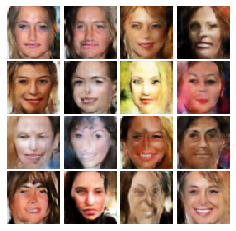


EPOCH:  47
Iter: 5400, D: 0.09682, G:1.751


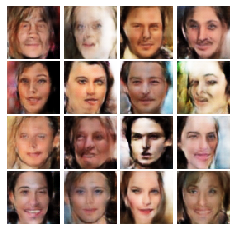


EPOCH:  48
Iter: 5550, D: 0.127, G:2.682


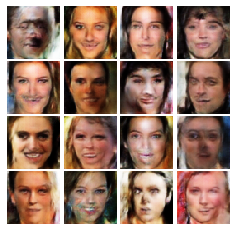


EPOCH:  49
EPOCH:  50
Iter: 5700, D: 0.102, G:2.67


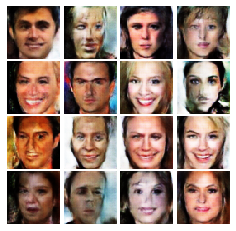

In [17]:
# original gan
train(D, G, D_optimizer, G_optimizer, discriminator_loss, 
          generator_loss, num_epochs=NUM_EPOCHS, show_every=150,
          train_loader=celeba_loader_train, device=device)


### Train LS-GAN

In [18]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [19]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 0.9511, G:12.25


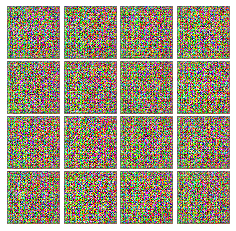


EPOCH:  2
Iter: 200, D: 0.1547, G:1.263


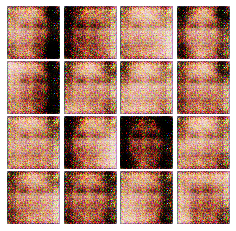


EPOCH:  3
EPOCH:  4
Iter: 400, D: 0.05717, G:0.9142


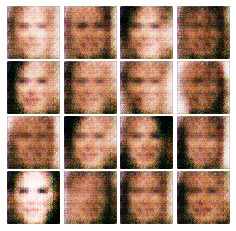


EPOCH:  5
EPOCH:  6
Iter: 600, D: 0.1415, G:0.5329


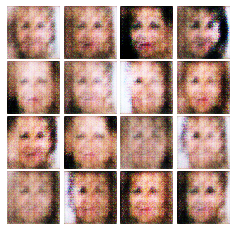


EPOCH:  7
Iter: 800, D: 0.2217, G:0.4657


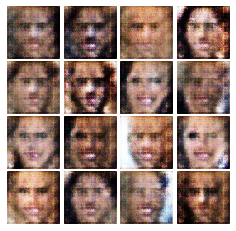


EPOCH:  8
EPOCH:  9
Iter: 1000, D: 0.1029, G:0.6821


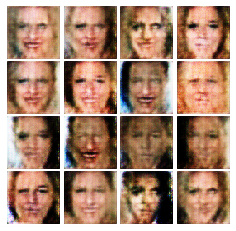


EPOCH:  10
EPOCH:  11
Iter: 1200, D: 0.08988, G:0.6592


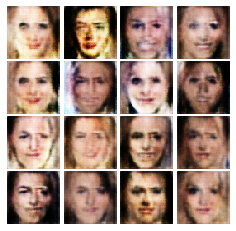


EPOCH:  12
EPOCH:  13
Iter: 1400, D: 0.1295, G:0.5076


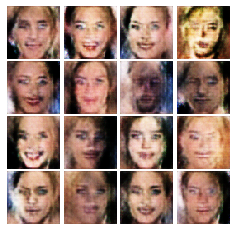


EPOCH:  14
Iter: 1600, D: 0.3236, G:1.908


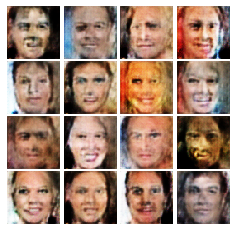


EPOCH:  15
EPOCH:  16
Iter: 1800, D: 0.1026, G:1.261


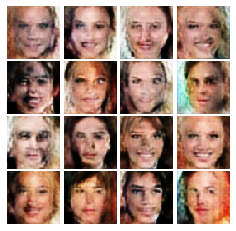


EPOCH:  17
EPOCH:  18
Iter: 2000, D: 0.1413, G:0.8443


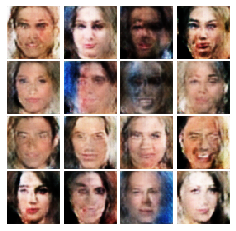


EPOCH:  19
Iter: 2200, D: 0.05969, G:0.6993


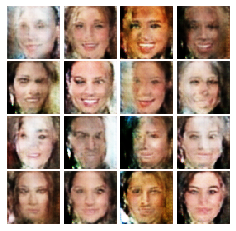


EPOCH:  20
EPOCH:  21
Iter: 2400, D: 0.04252, G:1.027


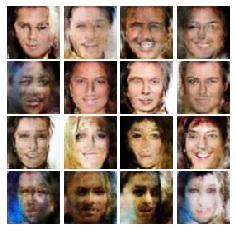


EPOCH:  22
EPOCH:  23
Iter: 2600, D: 0.1358, G:0.3697


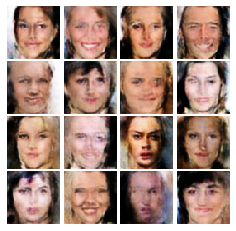


EPOCH:  24
EPOCH:  25
Iter: 2800, D: 0.06564, G:0.8371


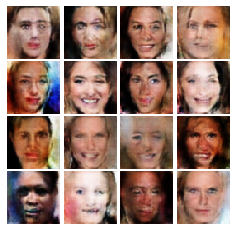


EPOCH:  26
Iter: 3000, D: 0.02463, G:1.025


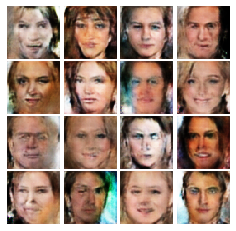


EPOCH:  27
EPOCH:  28
Iter: 3200, D: 0.06624, G:0.954


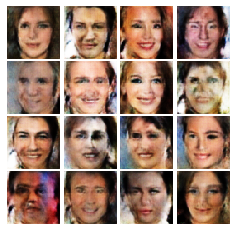


EPOCH:  29
EPOCH:  30
Iter: 3400, D: 0.04956, G:0.7815


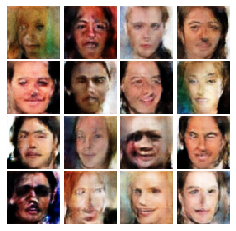


EPOCH:  31
EPOCH:  32
Iter: 3600, D: 0.0299, G:0.9561


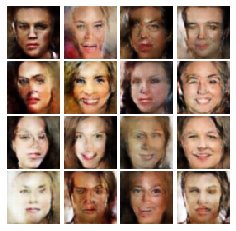


EPOCH:  33
Iter: 3800, D: 0.01346, G:0.84


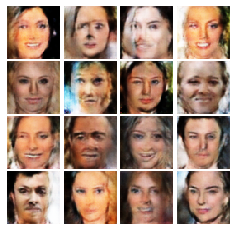


EPOCH:  34
EPOCH:  35
Iter: 4000, D: 0.02349, G:0.805


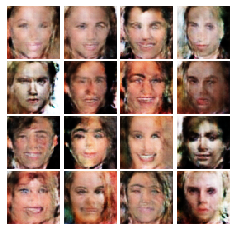


EPOCH:  36
EPOCH:  37
Iter: 4200, D: 0.04483, G:0.7381


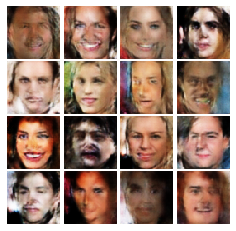


EPOCH:  38
Iter: 4400, D: 0.0877, G:0.7303


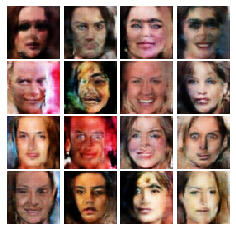


EPOCH:  39
EPOCH:  40
Iter: 4600, D: 0.01894, G:0.8681


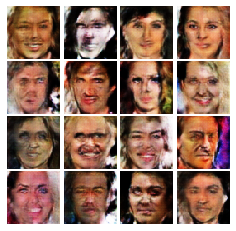


EPOCH:  41
EPOCH:  42
Iter: 4800, D: 0.1474, G:0.807


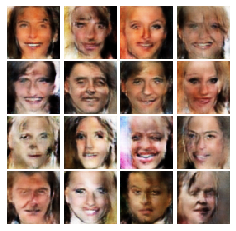


EPOCH:  43
EPOCH:  44
Iter: 5000, D: 0.04741, G:0.8162


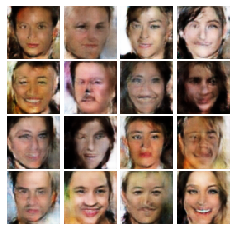


EPOCH:  45
Iter: 5200, D: 0.02862, G:0.8722


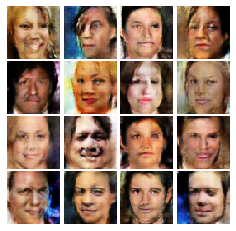


EPOCH:  46
EPOCH:  47
Iter: 5400, D: 0.01811, G:0.8085


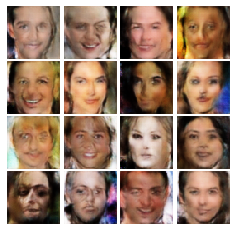


EPOCH:  48
EPOCH:  49
Iter: 5600, D: 0.01555, G:1.181


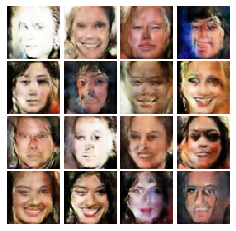


EPOCH:  50


In [20]:
# ls-gan
train(D, G, D_optimizer, G_optimizer, ls_discriminator_loss, 
          ls_generator_loss, num_epochs=NUM_EPOCHS, show_every=200,
          train_loader=celeba_loader_train, device=device)